# Random Forest Regression

## Importing the libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import seaborn as sns
import numpy as np
import time

## Importing the df

In [2]:
df = pd.read_csv('facies_vectors.csv')


#Taking Care of Missing Data

In [3]:
X = df.iloc[:, 1:].values
y = df.iloc[:, 0].values

In [4]:
 from sklearn.impute import SimpleImputer
 imputer = SimpleImputer(missing_values=np.nan, strategy='median')
 imputer.fit(X[:,[-3]])
 X[:, [-3]] = imputer.transform(X[:,[-3]])

## Getting Insights of data

In [32]:
df.head(4000)

,Facies,Formation,Well Name,Depth,GR,ILD_log10,DeltaPHI,PHIND,PE,NM_M,RELPOS
0,3,1,9,2793.0,77.450,0.664,9.900,11.915,4.600,1,1.000
1,3,1,9,2793.5,78.260,0.661,14.200,12.565,4.100,1,0.979
2,3,1,9,2794.0,79.050,0.658,14.800,13.050,3.600,1,0.957
3,3,1,9,2794.5,86.100,0.655,13.900,13.115,3.500,1,0.936
4,3,1,9,2795.0,74.580,0.647,13.500,13.300,3.400,1,0.915
...,...,...,...,...,...,...,...,...,...,...,...
3995,3,9,1,3042.5,81.688,0.705,-1.003,35.378,2.123,1,0.250
3996,8,8,1,3044.0,49.438,0.752,-8.496,19.434,4.785,1,0.063
3997,8,8,1,3044.5,34.375,0.772,-1.453,12.196,5.039,2,1.000
3998,8,8,1,3045.0,32.000,0.817,0.486,11.281,4.742,2,0.929


In [7]:
df.isna().any(axis = 0)

Facies       False
Formation    False
Well Name    False
Depth        False
GR           False
ILD_log10    False
DeltaPHI     False
PHIND        False
PE            True
NM_M         False
RELPOS       False
dtype: bool

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4149 entries, 0 to 4148
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Facies     4149 non-null   int64  
 1   Formation  4149 non-null   object 
 2   Well Name  4149 non-null   object 
 3   Depth      4149 non-null   float64
 4   GR         4149 non-null   float64
 5   ILD_log10  4149 non-null   float64
 6   DeltaPHI   4149 non-null   float64
 7   PHIND      4149 non-null   float64
 8   PE         3232 non-null   float64
 9   NM_M       4149 non-null   int64  
 10  RELPOS     4149 non-null   float64
dtypes: float64(7), int64(2), object(2)
memory usage: 356.7+ KB


Label Encoding Formation and Well Name

In [9]:
# Import label encoder
from sklearn import preprocessing
  
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
  
# Encode labels in column 'species'.
df['Formation']= label_encoder.fit_transform(df['Formation'])
df['Well Name']= label_encoder.fit_transform(df['Well Name'])
  
df.head()

,Facies,Formation,Well Name,Depth,GR,ILD_log10,DeltaPHI,PHIND,PE,NM_M,RELPOS
0,3,1,9,2793.0,77.45,0.664,9.9,11.915,4.6,1,1.000
1,3,1,9,2793.5,78.26,0.661,14.2,12.565,4.1,1,0.979
2,3,1,9,2794.0,79.05,0.658,14.8,13.050,3.6,1,0.957
3,3,1,9,2794.5,86.10,0.655,13.9,13.115,3.5,1,0.936
4,3,1,9,2795.0,74.58,0.647,13.5,13.300,3.4,1,0.915


In [10]:
df['Formation'].unique()

array([ 1,  0,  3,  2,  5,  4,  7,  6,  9,  8, 11, 10, 13, 12])

In [11]:
df['Well Name'].unique()


array([9, 0, 8, 4, 3, 2, 6, 7, 5, 1])

#One Hot Encoder



In [12]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
ct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [0,1])], remainder='passthrough')

X = np.array(ct.fit_transform(X))



In [13]:
X[1,: ]


array([0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 2793.5,
       78.26, 0.6609999999999999, 14.2, 12.565, 4.1, 1,
       0.9790000000000001], dtype=object)

In [14]:
X

array([[0.0, 1.0, 0.0, ..., 4.6, 1, 1.0],
       [0.0, 1.0, 0.0, ..., 4.1, 1, 0.9790000000000001],
       [0.0, 1.0, 0.0, ..., 3.6, 1, 0.9570000000000001],
       ...,
       [0.0, 0.0, 0.0, ..., 3.19, 2, 0.669],
       [0.0, 0.0, 0.0, ..., 3.1519999999999997, 2, 0.6609999999999999],
       [0.0, 0.0, 0.0, ..., 3.295, 2, 0.653]], dtype=object)

## Splitting the df into the Training set and Test set

In [15]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.05, random_state = 0)

## Feature Scaling

In [16]:
# from sklearn.preprocessing import StandardScaler
# sc = StandardScaler()
# X_train[:,-8:] = sc.fit_transform(X_train[:,-8:])
# X_test[:,-8:] = sc.transform(X_test[:,-8:])


## Training the Random Forest Regression model on the Training set

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4149 entries, 0 to 4148
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Facies     4149 non-null   int64  
 1   Formation  4149 non-null   int32  
 2   Well Name  4149 non-null   int32  
 3   Depth      4149 non-null   float64
 4   GR         4149 non-null   float64
 5   ILD_log10  4149 non-null   float64
 6   DeltaPHI   4149 non-null   float64
 7   PHIND      4149 non-null   float64
 8   PE         3232 non-null   float64
 9   NM_M       4149 non-null   int64  
 10  RELPOS     4149 non-null   float64
dtypes: float64(7), int32(2), int64(2)
memory usage: 324.3 KB


In [18]:
df.shape

(4149, 11)

In [19]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators = 20, random_state = 0)
classifier.fit(X_train, y_train)

RandomForestClassifier(n_estimators=20, random_state=0)

## Predicting a new result

## Predicting the Test set results

In [20]:
y_pred = classifier.predict(X_test)
print("prd,actual")
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

prd,actual
[[6 8]
 [8 8]
 [1 1]
 [6 6]
 [8 8]
 [2 2]
 [1 1]
 [6 6]
 [5 6]
 [1 1]
 [2 3]
 [6 6]
 [8 8]
 [2 2]
 [6 8]
 [6 6]
 [6 6]
 [2 2]
 [9 9]
 [2 2]
 [3 3]
 [8 8]
 [8 8]
 [5 6]
 [6 6]
 [2 2]
 [3 3]
 [2 2]
 [6 6]
 [4 4]
 [5 5]
 [6 5]
 [1 1]
 [1 1]
 [6 5]
 [2 2]
 [3 3]
 [7 7]
 [6 6]
 [8 8]
 [4 4]
 [3 3]
 [8 8]
 [8 8]
 [8 8]
 [2 2]
 [8 8]
 [6 6]
 [8 8]
 [1 1]
 [3 3]
 [3 3]
 [1 1]
 [3 3]
 [2 2]
 [1 1]
 [3 3]
 [8 8]
 [9 9]
 [2 2]
 [8 6]
 [6 6]
 [6 6]
 [6 6]
 [4 4]
 [2 2]
 [8 8]
 [8 8]
 [8 8]
 [2 2]
 [8 8]
 [2 2]
 [2 2]
 [8 8]
 [6 6]
 [1 8]
 [8 8]
 [2 2]
 [3 3]
 [9 9]
 [9 9]
 [8 8]
 [3 3]
 [3 3]
 [6 5]
 [3 3]
 [1 1]
 [8 8]
 [3 3]
 [8 8]
 [6 6]
 [6 6]
 [8 8]
 [3 3]
 [8 8]
 [8 8]
 [2 3]
 [5 5]
 [2 2]
 [2 2]
 [9 9]
 [8 8]
 [6 6]
 [8 8]
 [6 6]
 [2 3]
 [3 2]
 [8 5]
 [3 3]
 [2 2]
 [8 8]
 [8 8]
 [6 6]
 [2 2]
 [1 1]
 [5 5]
 [4 4]
 [6 8]
 [9 9]
 [8 8]
 [6 6]
 [4 4]
 [8 8]
 [8 6]
 [7 7]
 [6 6]
 [9 9]
 [8 8]
 [2 2]
 [7 7]
 [6 8]
 [6 6]
 [2 2]
 [1 1]
 [6 8]
 [2 2]
 [9 9]
 [8 8]
 [6 6]
 [1 1]
 [3 3]
 [

## Making the Confusion Matrix

In [21]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[19  0  0  0  0  0  0  0  0]
 [ 0 36  1  0  0  0  0  0  0]
 [ 0  5 25  0  0  0  0  0  0]
 [ 0  0  0  9  0  0  0  0  0]
 [ 0  0  0  0  5  3  0  1  0]
 [ 0  0  0  0  2 26  0  5  0]
 [ 0  0  0  0  0  0  7  0  0]
 [ 1  1  0  0  0  7  0 44  0]
 [ 0  0  0  0  0  0  0  0 11]]


0.875

#Evaluating the model performance (R2_score)

In [22]:
from sklearn.metrics import r2_score
r2_score(y_test, y_pred)

0.8966095307403412

## Visualising the Results

In [23]:
df_plot=df.drop(["RELPOS","NM_M"],axis=1)

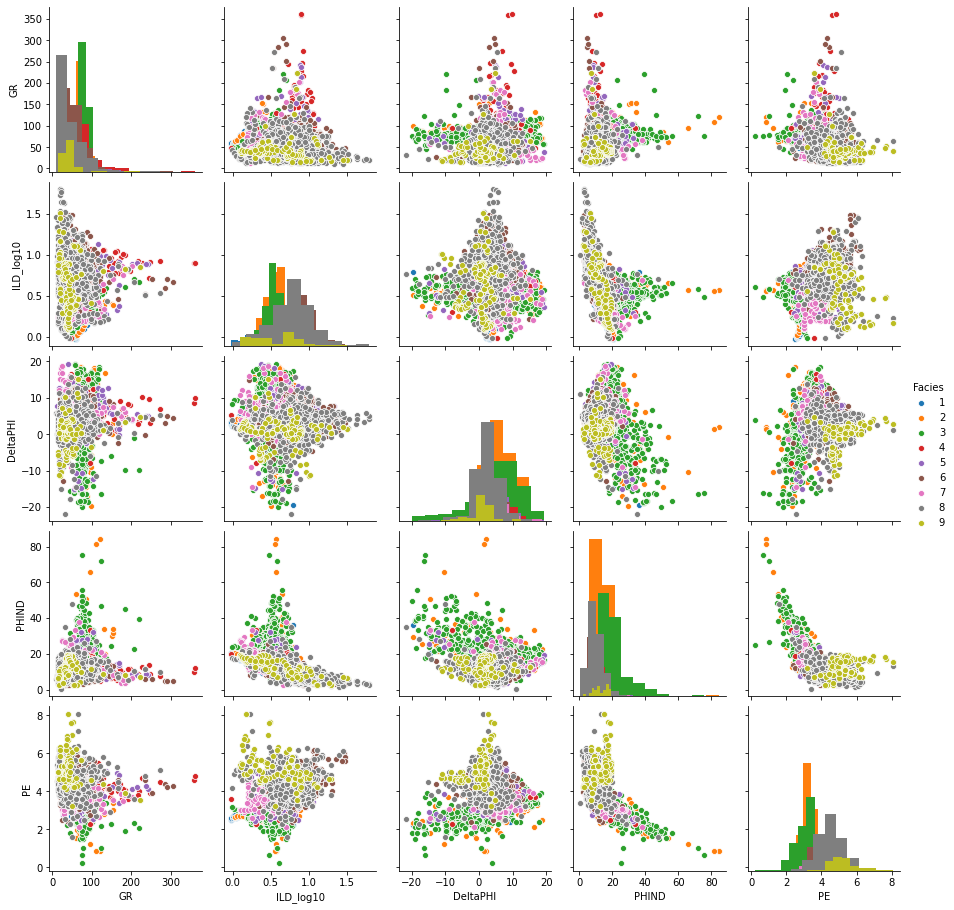

In [24]:
sns.pairplot(df_plot.drop(['Well Name','Depth','Formation'], axis = 1) ,hue='Facies',diag_kind='hist')

In [25]:
df.head()

,Facies,Formation,Well Name,Depth,GR,ILD_log10,DeltaPHI,PHIND,PE,NM_M,RELPOS
0,3,1,9,2793.0,77.45,0.664,9.9,11.915,4.6,1,1.000
1,3,1,9,2793.5,78.26,0.661,14.2,12.565,4.1,1,0.979
2,3,1,9,2794.0,79.05,0.658,14.8,13.050,3.6,1,0.957
3,3,1,9,2794.5,86.10,0.655,13.9,13.115,3.5,1,0.936
4,3,1,9,2795.0,74.58,0.647,13.5,13.300,3.4,1,0.915


In [26]:
D = df['Depth'].to_numpy()

In [27]:
print(D[:])

[2793.  2793.5 2794.  ... 3121.5 3122.  3122.5]


In [28]:
X_test[:,-8]

array([3065.5, 2936.0, 2791.5, 2668.0, 2926.0, 2946.5, 2603.0, 3048.5,
       2951.0, 2589.5, 2901.5, 3034.0, 2920.0, 3100.5, 2619.0, 2937.5,
       3055.5, 3009.0, 3014.0, 2991.0, 2948.5, 3028.0, 2940.0, 2984.5,
       2814.5, 2624.5, 2983.0, 2928.5, 2925.5, 2864.5, 2982.0, 2949.0,
       2596.0, 2795.5, 2978.5, 2995.0, 2948.0, 2767.5, 2940.5, 2766.0,
       3057.5, 2793.5, 2998.0, 2815.5, 2999.5, 2888.5, 2885.5, 2812.5,
       2945.0, 2924.5, 2837.0, 2671.0, 2727.0, 3087.5, 2999.0, 2701.0,
       2964.5, 2772.5, 3065.5, 2838.0, 2904.5, 2916.5, 2829.0, 2889.0,
       2967.0, 2992.0, 2770.0, 2945.0, 2864.0, 2901.5, 2923.0, 3018.5,
       2994.5, 2971.0, 2811.0, 2669.5, 2640.5, 2900.0, 2971.0, 2914.5,
       3067.5, 2948.0, 2924.5, 2785.5, 2926.0, 2832.0, 2588.0, 3102.0,
       2882.5, 3120.5, 2836.5, 2986.0, 3016.5, 2977.5, 2751.0, 2921.0,
       3050.5, 2983.5, 2743.5, 3097.5, 2903.0, 2935.5, 2947.0, 2944.0,
       2828.0, 3028.5, 2814.0, 3009.5, 2761.0, 3022.5, 3033.5, 2956.0,
      

In [29]:
print(X_test[0:208,-8])

[3065.5 2936.0 2791.5 2668.0 2926.0 2946.5 2603.0 3048.5 2951.0 2589.5
 2901.5 3034.0 2920.0 3100.5 2619.0 2937.5 3055.5 3009.0 3014.0 2991.0
 2948.5 3028.0 2940.0 2984.5 2814.5 2624.5 2983.0 2928.5 2925.5 2864.5
 2982.0 2949.0 2596.0 2795.5 2978.5 2995.0 2948.0 2767.5 2940.5 2766.0
 3057.5 2793.5 2998.0 2815.5 2999.5 2888.5 2885.5 2812.5 2945.0 2924.5
 2837.0 2671.0 2727.0 3087.5 2999.0 2701.0 2964.5 2772.5 3065.5 2838.0
 2904.5 2916.5 2829.0 2889.0 2967.0 2992.0 2770.0 2945.0 2864.0 2901.5
 2923.0 3018.5 2994.5 2971.0 2811.0 2669.5 2640.5 2900.0 2971.0 2914.5
 3067.5 2948.0 2924.5 2785.5 2926.0 2832.0 2588.0 3102.0 2882.5 3120.5
 2836.5 2986.0 3016.5 2977.5 2751.0 2921.0 3050.5 2983.5 2743.5 3097.5
 2903.0 2935.5 2947.0 2944.0 2828.0 3028.5 2814.0 3009.5 2761.0 3022.5
 3033.5 2956.0 3026.0 2844.5 2648.5 3037.0 2966.5 2952.0 3068.0 2997.5
 3015.0 2976.0 2739.5 2847.5 2981.5 2879.0 3074.0 2922.0 2799.5 2769.0
 2986.0 2889.0 2808.5 2744.5 3070.5 3025.5 2907.0 3027.0 2994.0 2794.5
 2805.

<ipython-input-30-6494ebc0ef60>:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax2 = fig.add_subplot(111)


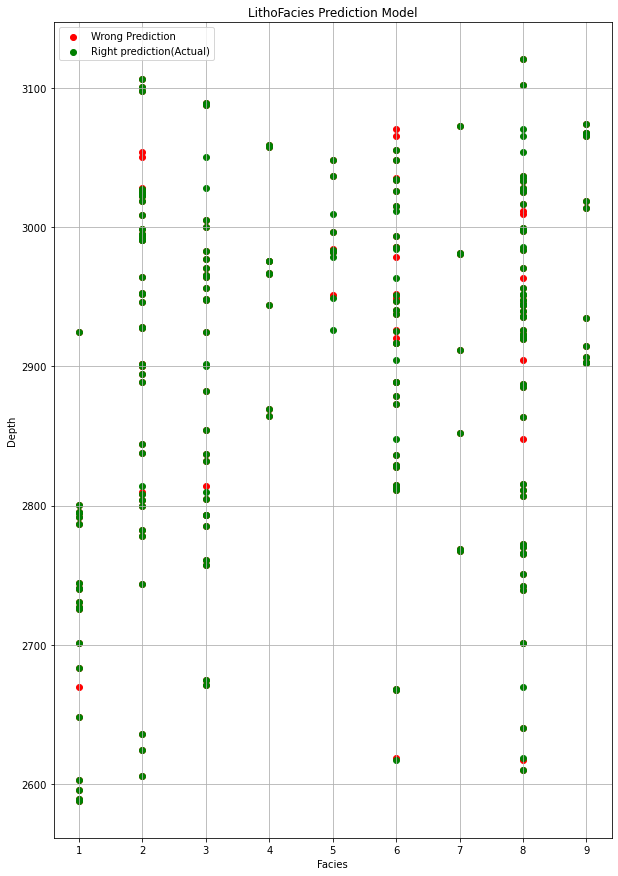

In [30]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (10,15))
ax1 = fig.add_subplot(111)
ax2 = fig.add_subplot(111)
# ax1.scatter(y_test[0:208],X_test[0:208,-8], c='red',label = 'wrongly predicted')
# ax1.legend()
# ax1.grid()
plt.grid()

ax1.set_xlabel('Facies')
ax1.set_ylabel('Depth')
ax1.set_title('Actuala')
ax2.set_xlabel('Facies')
ax2.set_ylabel('Depth')
ax2.set_title('LithoFacies Prediction Model')
ax2.scatter(y_pred[0:208],X_test[0:208,-8],c='r',label = 'Wrong Prediction')
ax2.legend()
ax2.grid()
ax1.scatter(y_test[0:208],X_test[0:208,-8], c='g',label = 'Right prediction(Actual)')
ax1.legend()
ax1.grid()

In [31]:
df['Facies'].unique()

array([3, 2, 8, 6, 7, 4, 5, 9, 1], dtype=int64)